In [ ]:
from google.colab import files
import itertools
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.ticker as ticker
from sklearn import preprocessing
%matplotlib inline

In [ ]:
uploaded = files.upload()

Saving data.csv to data.csv


In [ ]:
df = pd.read_csv('data.csv',delimiter=',',encoding="utf-8-sig")

In [ ]:
df

,column1,column2,column3,column4,column5,column6,column7,column8,column9,column10,column11,column12,column13,column14,column15,column16,column17,column18,column19,column20
0,account length,location code,user id,credit card info save,push status,add to wishlist,desktop sessions,app sessions,desktop transactions,total product detail views,session duration,promotion clicks,avg order value,sale product views,discount rate per visited products,product detail view per app session,app transactions,add to cart per session,customer service calls,churn
1,128,415,3824657,no,yes,25,265,45,17,110,197,87,244.7,91,11.01,10,3,2.7,1,0
2,107,415,3717191,no,yes,26,162,27,17,123,196,103,254.4,103,11.45,13.7,3,3.7,1,0
3,137,415,3581921,no,no,0,243,41,10,114,121,110,162.6,104,7.32,12.2,5,3.29,0,0
4,84,408,3759999,yes,no,0,299,51,5,71,62,88,196.9,89,8.86,6.6,7,1.78,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3384,192,415,4144276,no,yes,36,156,27,18,77,216,126,279.1,83,12.56,9.9,6,2.67,2,0
3385,68,415,3703271,no,no,0,231,39,13,57,153,55,191.3,123,8.61,9.6,4,2.59,3,0
3386,28,510,3288230,no,no,0,181,31,25,109,289,58,191.9,91,8.64,14.1,6,3.81,2,0
3387,184,510,3646381,yes,no,0,214,36,14,105,160,84,139.2,137,6.26,5,10,1.35,2,0


In [ ]:
#Reset header
df.columns = df.iloc[0]
df = df[1:].reset_index(drop = 1)
df

,account length,location code,user id,credit card info save,push status,add to wishlist,desktop sessions,app sessions,desktop transactions,total product detail views,session duration,promotion clicks,avg order value,sale product views,discount rate per visited products,product detail view per app session,app transactions,add to cart per session,customer service calls,churn
0,128,415,3824657,no,yes,25,265,45,17,110,197,87,244.7,91,11.01,10,3,2.7,1,0
1,107,415,3717191,no,yes,26,162,27,17,123,196,103,254.4,103,11.45,13.7,3,3.7,1,0
2,137,415,3581921,no,no,0,243,41,10,114,121,110,162.6,104,7.32,12.2,5,3.29,0,0
3,84,408,3759999,yes,no,0,299,51,5,71,62,88,196.9,89,8.86,6.6,7,1.78,2,0
4,75,415,3306626,yes,no,0,167,28,13,113,148,122,186.9,121,8.41,10.1,3,2.73,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3383,192,415,4144276,no,yes,36,156,27,18,77,216,126,279.1,83,12.56,9.9,6,2.67,2,0
3384,68,415,3703271,no,no,0,231,39,13,57,153,55,191.3,123,8.61,9.6,4,2.59,3,0
3385,28,510,3288230,no,no,0,181,31,25,109,289,58,191.9,91,8.64,14.1,6,3.81,2,0
3386,184,510,3646381,yes,no,0,214,36,14,105,160,84,139.2,137,6.26,5,10,1.35,2,0


# **Definition of Variables**
Account length: How many days the user has been a member of the site.

Location code: User's location code

User id: Unique ID assigned to the user.

Credit card info save: Information whether the user has saved the credit card 
in the system.

Push status: Whether the user allows notifications or not.

Add to wishlist: Number of times the user has added products to the wish list.

Desktop sessions: Number of user's desktop sessions.

App sessions: Number of user's app sessions.

Desktop transactions: The number of purchases made by the user from the desktop.

Total product detail reviews: User's product detail views.

Session duration: Average time spent by the user in their session.

Promotion clicks: Number of times user clicks on discount offers.

Avg order value: User's average order amount

Sale product views: User's discounted product views

Discount rate per visited products: Average discount rate of products viewed by the user.

Product detail view per app session: Average number of products users viewed detail per session.

App transactions: The number of purchases made by the user on the app.

Add to cart per session: User's average of adding to cart per session.

Customer service calls: Number of user calls to customer service

Churn: Information whether the user is churn | Target Variable





In [ ]:
df = df.drop(['user id'],axis=1)

In [ ]:
df.shape

(3388, 19)

In [ ]:
#Duplicate check
df.duplicated().value_counts()

False    3343
True       45
dtype: int64

In [ ]:
#Remove duplicate
df.drop_duplicates(inplace=True)

In [ ]:
#Missing values check
df_NaN = df[df.isna().any(axis=1)]
df_NaN

,account length,location code,credit card info save,push status,add to wishlist,desktop sessions,app sessions,desktop transactions,total product detail views,session duration,promotion clicks,avg order value,sale product views,discount rate per visited products,product detail view per app session,app transactions,add to cart per session,customer service calls,churn
122,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
149,36,510,NaN,NaN,NaN,NaN,NaN,NaN,89,255,122,138.3,126,6.22,20,6,5.4,0,1
150,64,510,no,no,0,163,28,13,83,152,109,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
151,NaN,NaN,NaN,no,0,283,48,19,114,NaN,NaN,170,115,7.65,9.4,4,2.54,1,1
152,NaN,NaN,NaN,NaN,36,114,19,13,117,158,82,177.6,118,7.99,10,3,2.7,2,0
153,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,81,6.45,8.7,5,2.35,2,0
154,46,408,no,no,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
155,41,408,no,yes,22,214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0
156,NaN,NaN,NaN,NaN,NaN,NaN,32,16,103,184,117,220.8,103,9.94,9.8,4,2.65,3,0
157,193,415,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.08,11.6,3,3.13,1,0


Since the missing value quantity is less than 5% of the dataset, I decide to remove them

In [ ]:
#Remove NaN
df= df.dropna(how = 'any', axis = 0).reset_index(drop=True)

In [ ]:
df.isnull().sum()

0
account length                         0
location code                          0
credit card info save                  0
push status                            0
add to wishlist                        0
desktop sessions                       0
app sessions                           0
desktop transactions                   0
total product detail views             0
session duration                       0
promotion clicks                       0
avg order value                        0
sale product views                     0
discount rate per visited products     0
product detail view per app session    0
app transactions                       0
add to cart per session                0
customer service calls                 0
churn                                  0
dtype: int64

In [ ]:
strange_value = []
for i in df.columns:
  if df[i].loc[df[i]=='-'].any():
    strange_value.append(i)
print(strange_value)

['product detail view per app session', 'app transactions', 'add to cart per session']


In [ ]:
df.loc[df['product detail view per app session']=='-',['product detail view per app session', 'app transactions', 'add to cart per session']].count()

0
product detail view per app session    18
app transactions                       18
add to cart per session                18
dtype: int64

In [ ]:
for i in df[['product detail view per app session', 'app transactions', 'add to cart per session']]:
  df.drop(df[df[i]=='-'].index, inplace=True)

**CHANGE DATA FORMAT**

In [ ]:
df_int = df[['account length','location code','add to wishlist','desktop sessions','app sessions','desktop transactions','total product detail views','session duration','promotion clicks','sale product views','app transactions','customer service calls','churn']]
df_float = df[['avg order value','discount rate per visited products','product detail view per app session','add to cart per session']]
for i in df_int:
  df[i] = df[i].astype('int')
for i in df_float:
  df[i] = df[i].astype('float')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3315 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   account length                       3315 non-null   int64  
 1   location code                        3315 non-null   int64  
 2   credit card info save                3315 non-null   object 
 3   push status                          3315 non-null   object 
 4   add to wishlist                      3315 non-null   int64  
 5   desktop sessions                     3315 non-null   int64  
 6   app sessions                         3315 non-null   int64  
 7   desktop transactions                 3315 non-null   int64  
 8   total product detail views           3315 non-null   int64  
 9   session duration                     3315 non-null   int64  
 10  promotion clicks                     3315 non-null   int64  
 11  avg order value               

In [ ]:
numeric = ['account length', 'location code', 'add to wishlist',
       'desktop sessions', 'app sessions', 'desktop transactions',
       'total product detail views', 'session duration', 'promotion clicks',
       'avg order value', 'sale product views',
       'discount rate per visited products',
       'product detail view per app session', 'app transactions',
       'add to cart per session', 'customer service calls']
categories = ['location code','credit card info save','push status']

In [ ]:
df.shape

(3315, 19)

In [ ]:
df['churn'].value_counts()

0    2832
1     483
Name: churn, dtype: int64

**OUTLIER DETECTION**

In [ ]:
!pip install --upgrade pip
!pip uninstall pandas_profiling
!pip install pandas_profiling
from pandas_profiling import ProfileReport

In [ ]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
from collections import Counter
# Function to detect outliers in dataset
def detect_outliers(df,features):
    outlier_indices = [] # Initialize list of outlier indices
    
    # Iterate over features
    for i in features:
        # Calculate 1st, 3rd quartiles and IQR
        Q1 = np.percentile(df[i],25) 
        Q3 = np.percentile(df[i],75) 
        IQR = Q3 - Q1 

        # Compute outlier step
        outlier_step = IQR * 1.5 

        # Determine indices of outliers in current feature
        outlier_list_col = df[(df[i] < Q1 - outlier_step) | (df[i] > Q3 + outlier_step)].index 

        # Append outlier indices to list
        outlier_indices.extend(outlier_list_col) 

    # Count number of outlier indices for each data point
    outlier_indices = Counter(outlier_indices)

    # Select rows with more than two outlier indices
    multiple_outliers = list(k for k, v in outlier_indices.items() if v > 2) 

    # Return list of outlier indices
    return multiple_outliers

In [ ]:
# Use function to find outliers in dataset
outlier_indices = detect_outliers(df, numeric)
print("Outlier indices:", outlier_indices)

Outlier indices: [3216, 15, 1345, 1397, 2736, 1960, 2732, 2932, 883, 3247, 3234, 2004, 3307]


In [ ]:
#Remove outliers:
df = df.drop(outlier_indices, axis = 0)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3302 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   account length                       3302 non-null   int64  
 1   location code                        3302 non-null   int64  
 2   credit card info save                3302 non-null   object 
 3   push status                          3302 non-null   object 
 4   add to wishlist                      3302 non-null   int64  
 5   desktop sessions                     3302 non-null   int64  
 6   app sessions                         3302 non-null   int64  
 7   desktop transactions                 3302 non-null   int64  
 8   total product detail views           3302 non-null   int64  
 9   session duration                     3302 non-null   int64  
 10  promotion clicks                     3302 non-null   int64  
 11  avg order value               

In [ ]:
#Fix bias targets
df1 = df.loc[df['churn'] == 1]
count = 1
while count <= 4:
  df = pd.concat([df,df1], ignore_index=True)
  count+=1
df.reset_index(inplace = True, drop= True)

# **Data Visualization**

**Target Visualization**

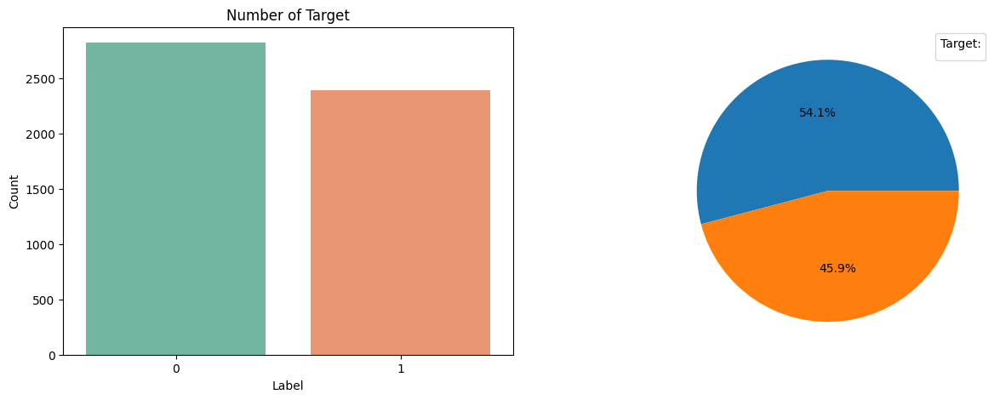

In [ ]:
# Visualize number of target values in dataset
plt.figure(figsize=(15,5))

# Create bar plot showing count of target value
plt.subplot(1, 2, 1)
sns.countplot(x = "churn", data = df, palette = "Set2")
plt.title("Number of Target")
plt.xlabel("Label")
plt.ylabel("Count")

# Create pie chart showing proportion of target value
plt.subplot(1, 2, 2)
plt.pie(df["churn"].value_counts(), autopct = "%1.1f%%")
plt.legend(title = "Target:")

# Display plots
plt.show()

**Categorical Visualization**

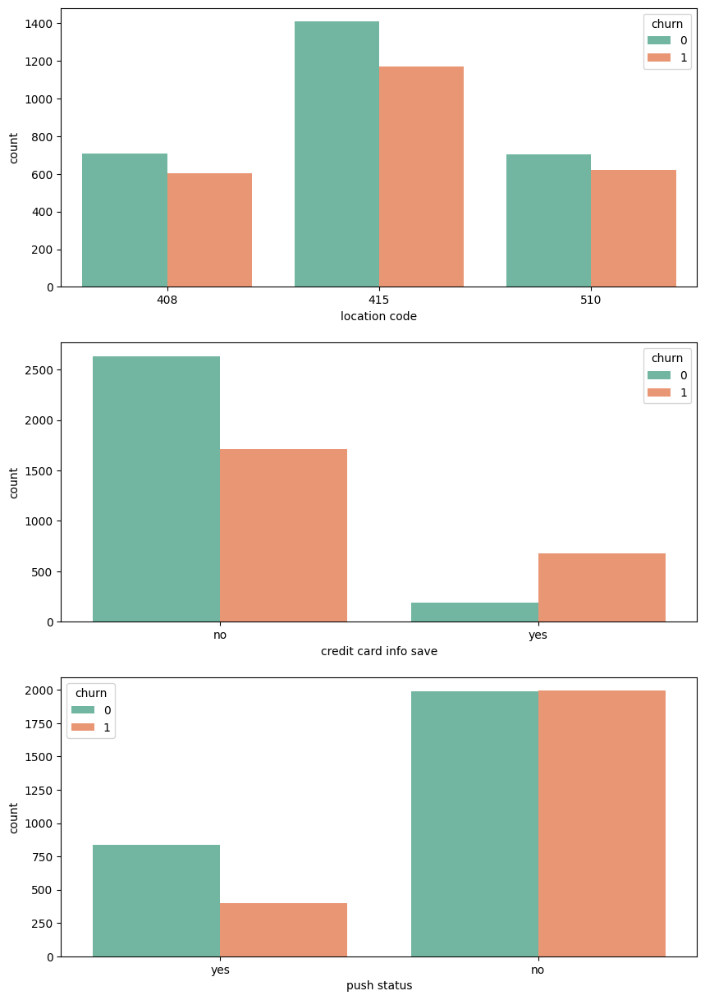

In [ ]:
# Visualize distributions of categorical features by target value
i = 0
plt.figure(figsize=(10,15))

# Create plot for each categorical feature
for categorical_feature in categories:
    i += 1
    plt.subplot(3, 1, i)
    # Create countplot showing count of each category by target value
    sns.countplot(x = df[categorical_feature], data = df, hue = 'churn', palette = 'Set2')

# Display plots    
plt.show()

**Numerical Visualization**

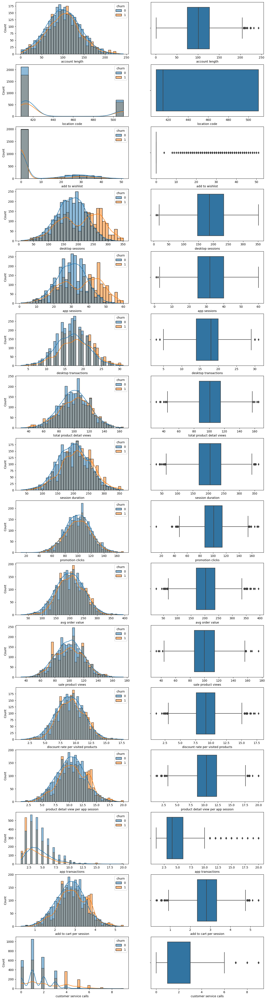

In [ ]:
# Visualize distributions of numerical features by target value
i = 0
plt.figure(figsize=(15,60))

# Create two plots for each numerical feature
for numerical_feature in numeric:

    i += 1
    plt.subplot(16, 2, i)
    # Create histogram showing distribution of feature values by target value
    sns.histplot(x = df[numerical_feature], data = df, kde = True, hue = "churn")

    i += 1
    plt.subplot(16, 2, i)
    # Create boxplot showing distribution of feature values in general
    sns.boxplot(x = df[numerical_feature], data = df)
    
# Display plots   
plt.show()

In [ ]:
#Download to import to Power BI for further insights
from google.colab import files
df.to_csv('data(PBI).csv') 
files.download('data(PBI).csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Feature Engineering**

**Feature scaling**

In [ ]:
# Encode categorical features using the get_dummies function
df = pd.get_dummies(df, columns = ['credit card info save', 'push status'])

In [ ]:
# Scale numerical features using the StandardScaler function
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df[numeric] = scaler.fit_transform(df[numeric])

In [ ]:
df

,account length,location code,add to wishlist,desktop sessions,app sessions,desktop transactions,total product detail views,session duration,promotion clicks,avg order value,...,discount rate per visited products,product detail view per app session,app transactions,add to cart per session,customer service calls,churn,credit card info save_no,credit card info save_yes,push status_no,push status_yes
0,0.667502,-0.526196,1.366366,1.227164,1.220958,-0.099308,0.447349,-0.159879,-0.670597,0.853380,...,0.852635,-0.166486,-0.553338,-0.167210,-0.511069,0,1,0,0,1
1,0.138209,-0.526196,1.442420,-0.457917,-0.508923,-0.099308,1.085328,-0.179495,0.137328,1.050831,...,1.051664,1.196824,-0.553338,1.197501,-0.511069,0,1,0,0,1
2,0.894342,-0.526196,-0.534968,0.867244,0.836540,-1.705032,0.643650,-1.650727,0.490796,-0.817835,...,-0.816495,0.644131,0.252950,0.637969,-1.150425,0,1,0,1,0
3,-0.441493,-0.691047,-0.534968,1.783405,1.797586,-2.851977,-1.466588,-2.808096,-0.620102,-0.119630,...,-0.119893,-1.419257,1.059239,-1.422743,0.128288,0,0,1,1,0
4,-0.668333,-0.526196,-0.534968,-0.376117,-0.412818,-1.016865,0.594575,-1.121084,1.096739,-0.323188,...,-0.323446,-0.129640,-0.553338,-0.126268,0.767644,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5213,-0.441493,-0.526196,-0.534968,1.472565,1.509272,-0.099308,0.594575,-0.061797,-0.519111,-0.935899,...,-0.934103,-0.019101,-0.150194,-0.017092,-1.150425,1,1,0,1,0
5214,-0.769150,1.711069,-0.534968,-0.065277,-0.028400,-0.099308,0.643650,-0.120646,2.005655,0.075786,...,0.074612,1.233670,0.252950,1.238442,1.407001,1,0,1,1,0
5215,0.516275,1.711069,-0.534968,-0.817838,-0.797237,-0.099308,0.005671,-0.179495,-1.175550,-1.682959,...,-1.684985,-0.277024,-0.150194,-0.276387,1.407001,1,0,1,1,0
5216,-0.995990,-0.691047,-0.534968,2.143325,2.182004,1.277026,0.201972,1.193655,1.096739,-0.453466,...,-0.454624,0.386207,-0.956483,0.392322,1.407001,1,1,0,1,0


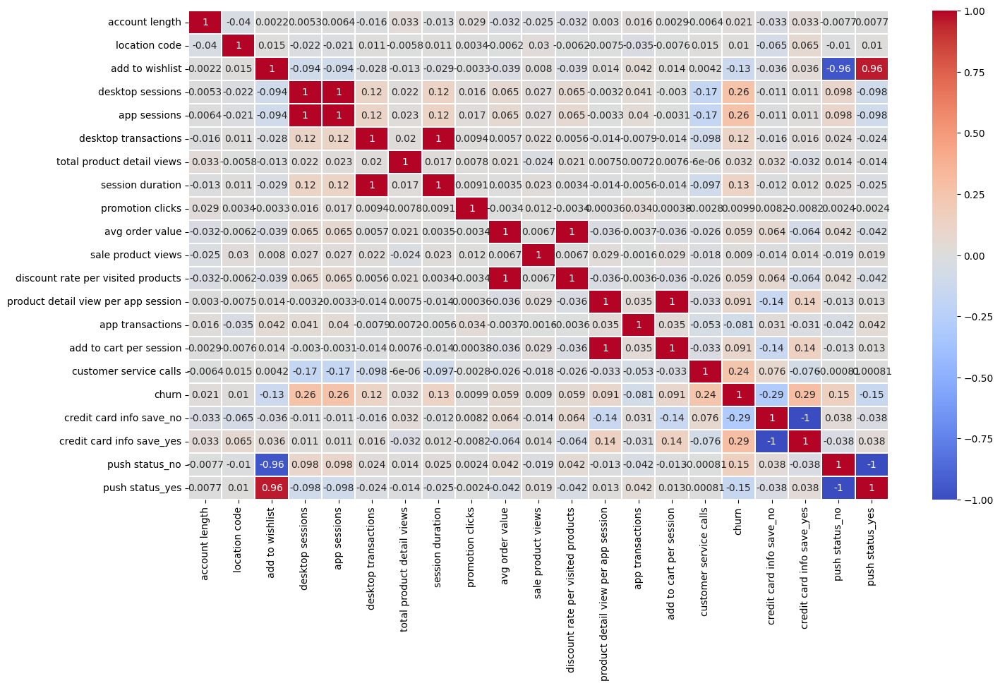

In [ ]:
#Show visualization heatmap for dataset
plt.figure(figsize=(16,9))
sns.heatmap(df.corr(),vmax=1,vmin=-1,linewidth=0.1,cmap='coolwarm',annot=True)
plt.show()

In [ ]:
df['churn'].value_counts()

0    2823
1    2395
Name: churn, dtype: int64

**Split data into train set and test set**

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold

In [ ]:
X = df.drop('churn',axis=1)
y = df['churn']

In [ ]:
# Split dataset into training and testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 128) # %70 train data, %30 test data

# Print lengths of training and testing datasets for each feature and target variable
print("X_train: ",len(X_train))
print("X_test: ",len(X_test))
print("y_train: ",len(y_train))
print("y_test: ",len(y_test))

X_train:  3652
X_test:  1566
y_train:  3652
y_test:  1566


# **Building and Training model**

In [ ]:
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

random_state = 128 

# Define the machine learning models
model = [SVC(random_state = random_state, probability=True),
         RandomForestClassifier(random_state = random_state),
         KNeighborsClassifier(),
         LogisticRegression(),
         DecisionTreeClassifier()] 

# Define the list of class names
model_names = ["SVM",
               "RandomForestClassifier",
               "KNeighborsClassifier",
               "LogisticRegression",
               "DecisionTreeClassifier"]

# Define the hyperparameter grids for each model
svm_params = {"kernel" : ["rbf"],
              "gamma": [0.001, 0.01, 0.1],
              "C": [1,10,50,100,200]} 

rf_params = {"n_estimators":[100,200,300,400]}

knn_params = {"n_neighbors": [1,2,3,4,5,6,7,8,9,10],
              "weights": ["uniform","distance"],
              "metric":["euclidean","manhattan"]}

lgr_params = {'penalty': ['l1','l2'],
              'C': [0.001,0.01,0.1,1,10,100,1000]}

tree_params = {'criterion':['gini','entropy'],
               'max_depth':[4,5,6,7,8,9,10,11,12,15,20,30,40,50,70,90,120,150]}

# Define a list of hyperparameter grids
param_grids = [svm_params,
               rf_params,
               knn_params,
               lgr_params,
               tree_params] 

# **Evaluating the Model Performance**

Fitting 5 folds for each of 15 candidates, totalling 75 fits
Machine Learning Models: SVM
Cross Validation Scores: 0.9389385904090849
Best Parameters: SVC(C=100, gamma=0.1, probability=True, random_state=128)

-----------------------------------------------------

Train Accuracy of Classifier:  1.0
Test Accuracy of Classifier:  0.9533844189016603
The F1 Score of Classifier:  0.9533844189016603

-----------------------------------------------------

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      0.92      0.96       863
           1       0.91      1.00      0.95       703

    accuracy                           0.95      1566
   macro avg       0.95      0.96      0.95      1566
weighted avg       0.96      0.95      0.95      1566


-----------------------------------------------------

Confusion Matrix: 



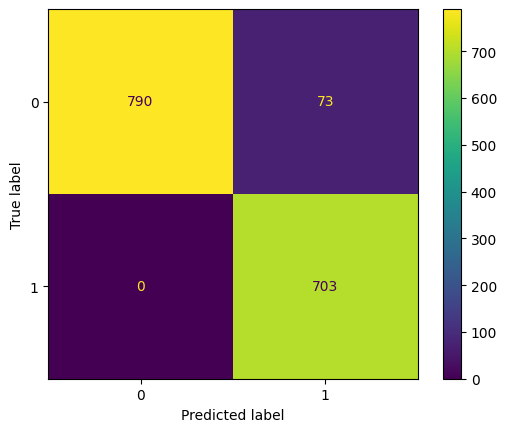


****************************************************************

Fitting 5 folds for each of 4 candidates, totalling 20 fits
Machine Learning Models: RandomForestClassifier
Cross Validation Scores: 0.9816517062384049
Best Parameters: RandomForestClassifier(random_state=128)

-----------------------------------------------------

Train Accuracy of Classifier:  1.0
Test Accuracy of Classifier:  0.9872286079182631
The F1 Score of Classifier:  0.9872286079182631

-----------------------------------------------------

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      0.98      0.99       863
           1       0.97      1.00      0.99       703

    accuracy                           0.99      1566
   macro avg       0.99      0.99      0.99      1566
weighted avg       0.99      0.99      0.99      1566


-----------------------------------------------------

Confusion Matrix: 



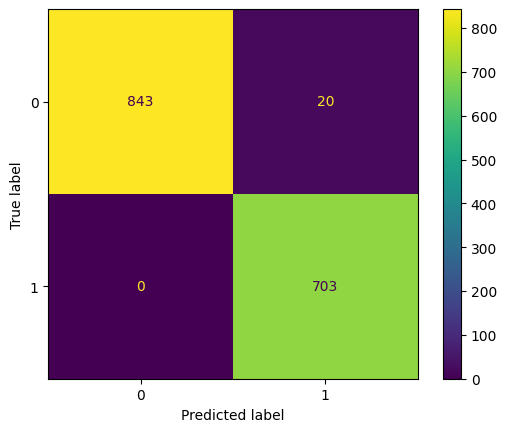


****************************************************************

Fitting 5 folds for each of 40 candidates, totalling 200 fits
Machine Learning Models: KNeighborsClassifier
Cross Validation Scores: 0.9359256413619924
Best Parameters: KNeighborsClassifier(metric='manhattan', n_neighbors=1)

-----------------------------------------------------

Train Accuracy of Classifier:  1.0
Test Accuracy of Classifier:  0.9597701149425287
The F1 Score of Classifier:  0.9597701149425287

-----------------------------------------------------

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      0.93      0.96       863
           1       0.92      1.00      0.96       703

    accuracy                           0.96      1566
   macro avg       0.96      0.96      0.96      1566
weighted avg       0.96      0.96      0.96      1566


-----------------------------------------------------

Confusion Matrix: 



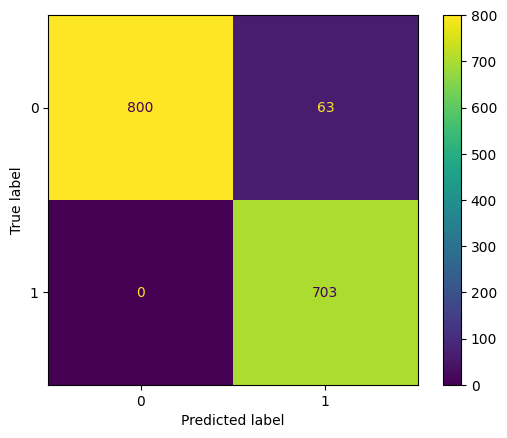


****************************************************************

Fitting 5 folds for each of 14 candidates, totalling 70 fits


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
35 fits failed out of a total of 70.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
35 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1162, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 54, in _check_solver
    raise ValueError(
ValueError: Solve

Machine Learning Models: LogisticRegression
Cross Validation Scores: 0.7565751550699923
Best Parameters: LogisticRegression(C=10)

-----------------------------------------------------

Train Accuracy of Classifier:  0.7667031763417306
Test Accuracy of Classifier:  0.7777777777777778
The F1 Score of Classifier:  0.7777777777777778

-----------------------------------------------------

Classification Report: 
               precision    recall  f1-score   support

           0       0.79      0.80      0.80       863
           1       0.76      0.75      0.75       703

    accuracy                           0.78      1566
   macro avg       0.78      0.77      0.78      1566
weighted avg       0.78      0.78      0.78      1566


-----------------------------------------------------

Confusion Matrix: 



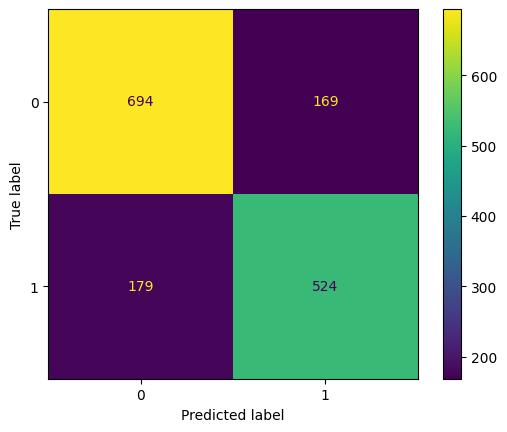


****************************************************************

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Machine Learning Models: DecisionTreeClassifier
Cross Validation Scores: 0.9581065532297659
Best Parameters: DecisionTreeClassifier(criterion='entropy', max_depth=90)

-----------------------------------------------------

Train Accuracy of Classifier:  1.0
Test Accuracy of Classifier:  0.9616858237547893
The F1 Score of Classifier:  0.9616858237547893

-----------------------------------------------------

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      0.93      0.96       863
           1       0.92      1.00      0.96       703

    accuracy                           0.96      1566
   macro avg       0.96      0.97      0.96      1566
weighted avg       0.96      0.96      0.96      1566


-----------------------------------------------------

Confusion Matrix: 



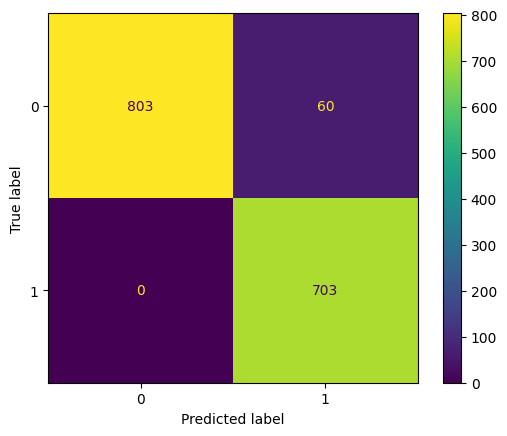


****************************************************************



In [ ]:
from sklearn.metrics import f1_score, accuracy_score, ConfusionMatrixDisplay, classification_report, confusion_matrix

# Define two list to store the results and estimators
cv_result = []
best_estimators = []

# Iterate over the models and their hyperparameter grids
for i in range(len(model)):

    # Define the stratified K-fold cross-validation scheme
    cv = StratifiedKFold(n_splits = 5)
    
    # Define the grid search strategy
    clf = GridSearchCV(model[i], 
                       param_grid=param_grids[i], 
                       cv = cv, 
                       scoring = "accuracy", 
                       n_jobs = -1,
                       verbose = 1)
    
    # Print the cross validation score, best parameters and the train and test accuracy of the model
    clf.fit(X_train,y_train)
    cv_result.append(clf.best_score_)
    best_estimators.append(clf.best_estimator_)

    print("Machine Learning Models:", model_names[i])
    print("Cross Validation Scores:", cv_result[i])
    print("Best Parameters:", best_estimators[i])
    print("\n-----------------------------------------------------\n")

    print("Train Accuracy of Classifier: ", accuracy_score(y_train, clf.predict(X_train)))
    print("Test Accuracy of Classifier: ", accuracy_score(y_test, clf.predict(X_test)))
    print("The F1 Score of Classifier: ", f1_score(y_test, clf.predict(X_test), average='micro'))
    print("\n-----------------------------------------------------\n")

    # Print the classification report and plot the ROC curve and confusion matrix
    print("Classification Report: \n", classification_report(y_test, clf.predict(X_test)))
    print("\n-----------------------------------------------------\n")

    print("Confusion Matrix: \n")
    disp = ConfusionMatrixDisplay(confusion_matrix(y_test, clf.predict(X_test)))
    disp.plot()
    plt.show()
    print("\n****************************************************************\n")

# **Feature Importance**

In [ ]:
from IPython.core.display import display_markdown
from pandas.core.dtypes.common import conversion
from sklearn.ensemble import RandomForestClassifier

tree = RandomForestClassifier(random_state=128)

tree.fit(X_train,y_train)

feat_imp = pd.DataFrame(tree.feature_importances_, index=X_train.columns, columns = ['importance']).sort_values('importance',ascending = False)
feat_imp

,importance
customer service calls,0.155380
desktop sessions,0.138071
app sessions,0.115134
session duration,0.060344
credit card info save_yes,0.055268
credit card info save_no,0.049643
desktop transactions,0.041257
app transactions,0.041147
product detail view per app session,0.040433
avg order value,0.039621


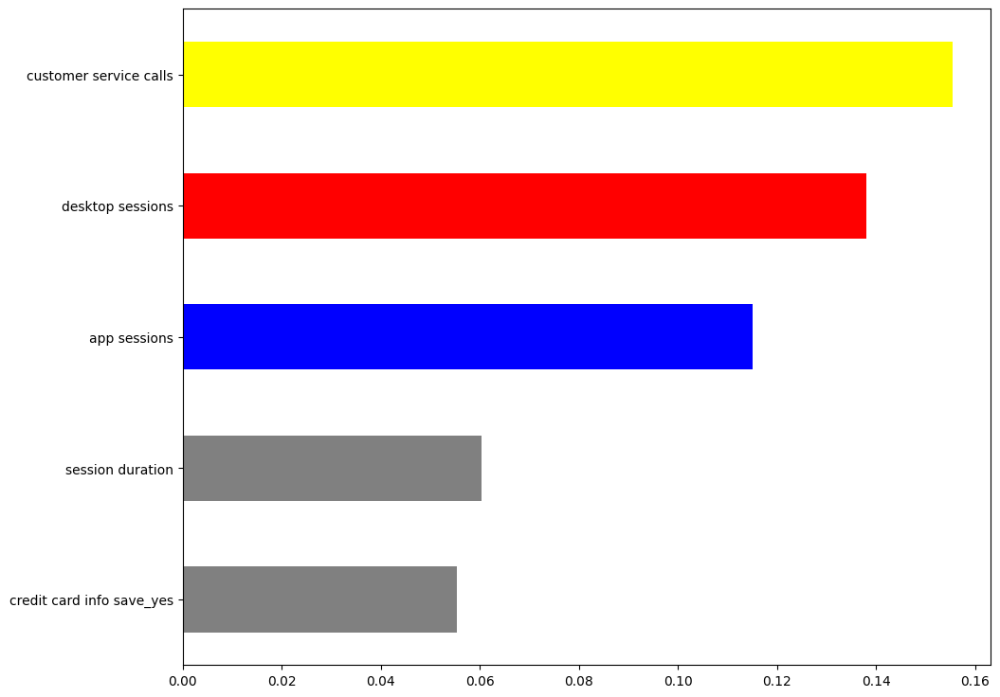

In [ ]:
plt.figure(figsize=(11,9))
feat_imp = pd.Series(tree.feature_importances_, index=X_train.columns)
chart=feat_imp.nlargest(5).sort_values().plot(kind='barh', color=['grey','grey','blue','red','yellow'])
plt.show()

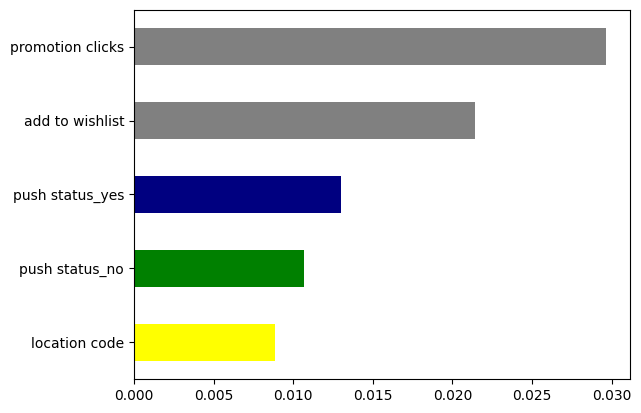

In [ ]:
chart=feat_imp.nsmallest(5).sort_values().plot(kind='barh', color=['yellow','green','navy','grey','grey'])